# OCR справок о донорстве крови

Импортируем используемые в проекте библиотеки и модули.

In [71]:
# использумеые библиотеки
import os
import cv2
import pandas as pd
import numpy as np
import statistics 
from matplotlib import pyplot as plt
from PIL import Image as PILImage
from transformers import DetrImageProcessor, DetrForObjectDetection 
from img2table.ocr import EasyOCR
from img2table.ocr import TesseractOCR
from img2table.document import Image
from tabulate import tabulate
from IPython.display import display_html

# класс распознавания таблицы
import TableExtractor as te  
import TableExtractor1 as te1

# класс, который переводит таблицу в формат csv
import TableToCsv1 as ta

In [72]:
# папка с файлами заказчика
original_dir='images_form_405/' 

# папка с результатами работы TesseractOCR
tesseract = r'results/read_table/table_'

# результаты работы класса TableExtractor
results_te = r'results/te/'

# результаты работы класса TableExtractor1
results_te1 = r'results/te1/'

paths_images = [i for i in os.listdir(original_dir) if 'jpg' in i]

## Ход работы: проведенные эксперименты

Мы начали выполнение проекта с тестирования работы библиотеки `img2table` с поддержкой `TesseractOCR`. Данное решение показывало такие резульаты.

ПРИМЕР №1
Исходное изображение с разметкой найденных ячеек таблицы


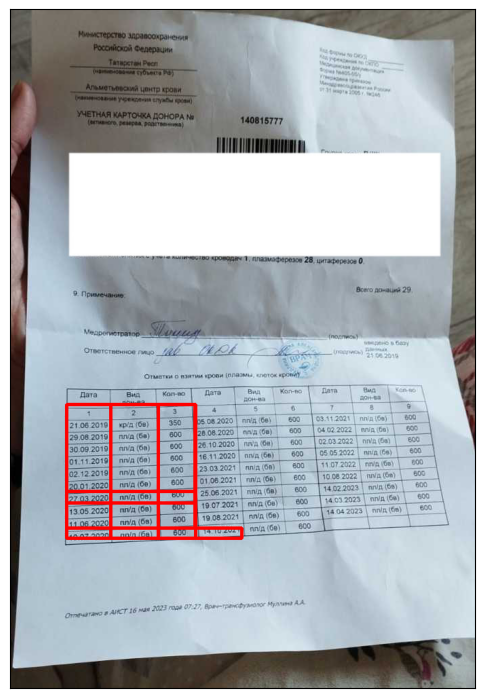

Считанная таблица
-  -----------  ----  ---  ---  ---------
0  27.03.2020   (68)  nan  nan  nan
1  13.05.2020]  nan   800  nan  nan
2  nan          nan   nan  nan  [14102621
-  -----------  ----  ---  ---  ---------


ПРИМЕР №2
Исходное изображение с разметкой найденных ячеек таблицы


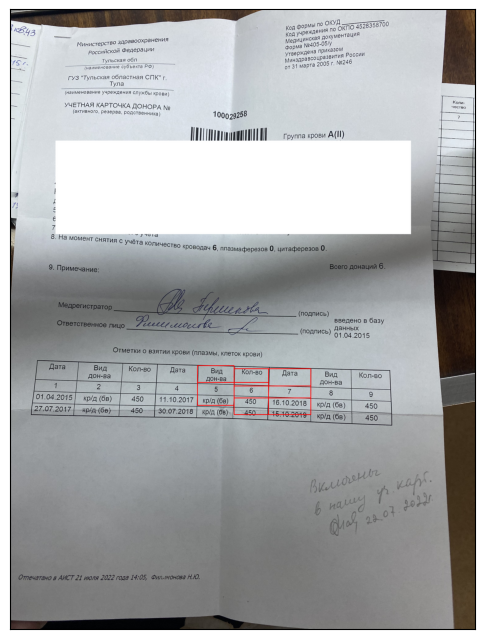

Считанная таблица
-  ----  ---  ---
0  кр/д  nan  nan
-  ----  ---  ---


ПРИМЕР №3
Исходное изображение с разметкой найденных ячеек таблицы


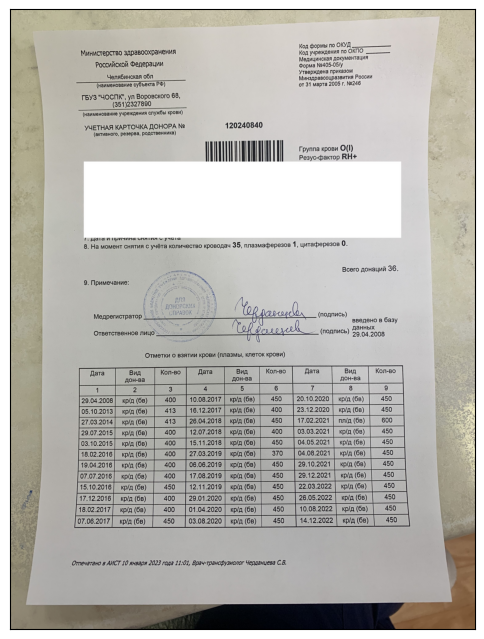

Считанная таблица



ПРИМЕР №4
Исходное изображение с разметкой найденных ячеек таблицы


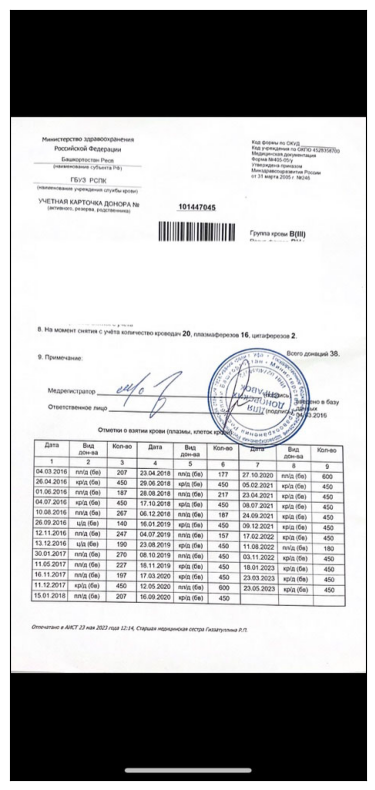

Считанная таблица



ПРИМЕР №5
Исходное изображение с разметкой найденных ячеек таблицы


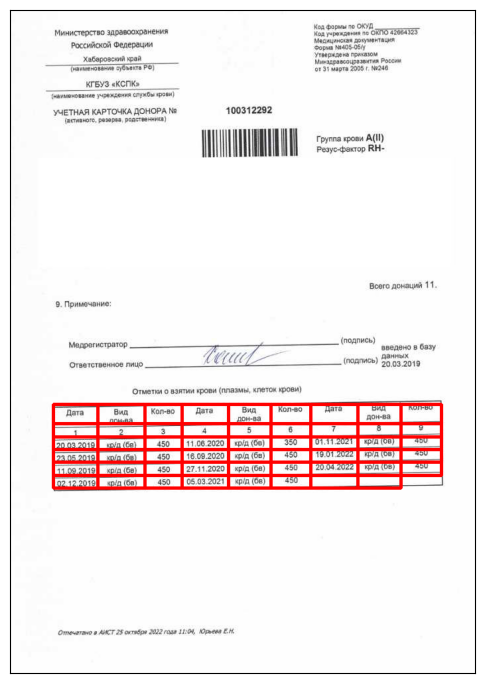

Считанная таблица
-  -----------  ----  ---  ----------  ----  ---  ---  ----  ---
0  т            2     nan  nan         nan   nan  т    nan   nan
1  nan          (68)  nan  nan         (69)  350  nan  (68)  450
2  23.05.2019   nan   450  16.09.2020  nan   450  nan  (68)  450
3  nan          nan   nan  nan         (68)  450  nan  (68)  450
4  [02.12.2019  nan   nan  05.03.2021  nan   450  nan  nan   nan
-  -----------  ----  ---  ----------  ----  ---  ---  ----  ---




In [73]:
ocr = TesseractOCR(n_threads=1, lang="rus")

# Instantiation of document, either an image or a PDF
k = 1
for i in [0, 1, 9, 11, 13]:
    image_path = original_dir + f'{i}' + '.jpg'
    image = Image(src=image_path, detect_rotation=False)
    extracted_tables = image.extract_tables(ocr=ocr,
                                          implicit_rows=False,
                                          borderless_tables=False,
                                          min_confidence=50)
    
    #extracted_tables = image.extract_tables()
    original_img_bgr = cv2.imdecode(np.fromfile(image_path, dtype=np.uint8), cv2.IMREAD_COLOR)
    original_img_rgb = cv2.cvtColor(original_img_bgr, cv2.COLOR_BGR2RGB)
    for table in extracted_tables:
        for row in table.content.values():
            for cell in row:
                cv2.rectangle(original_img_rgb, (cell.bbox.x1, cell.bbox.y1), (cell.bbox.x2, cell.bbox.y2), (255, 0, 0), 3)

    print(f'ПРИМЕР №{k}')
    k += 1
    print('Исходное изображение с разметкой найденных ячеек таблицы')
    plt.figure(figsize=(6, 10))
    plt.imshow(PILImage.fromarray(original_img_rgb))
    plt.xticks([])
    plt.yticks([])
    plt.show()
    
    print('Считанная таблица')
    path_table = tesseract + f'{i}.xlsx'
    image.to_xlsx(path_table,
                ocr=ocr,
                implicit_rows=False,
                borderless_tables=False,
                min_confidence=50)
    df = pd.read_excel(path_table)
    print(tabulate(df))
    
    print('\n')

По данным примерам видно следующее.
* `img2table` не учитывает наклон таблиц на изображениях и следовательно неправильно такие таблицы размечает. Даже самый небольшой наклон даёт не позволяет `img2table` корректно разметить таблицу.
* Даже на изображениях хорошего качества, на которых таблица никак не наклонена `img2table` может не найти таблицу.
* `TesseractOCR` достаточно хорошо считывает с изображения числовые данные, но не буквенный текст, что хорошо видно в последнем примере.

Отсюда мы сделали выводы, что необходимо заняться в певую очередь предобработкой изображения, а затем уже считывать данные в таблицу. Ниже рассмотрены два класса предобработки изображения: TableExtractor выдает бинаризированное изображение, для TableExtractor1 таблица извлекается из предобработанного, но не бинаризированного изображения

## Извлечение таблицы из изображения

Изображение таблицы мы извлекаем с помощью класса `TableExtractor`.

In [74]:
processor = DetrImageProcessor.from_pretrained("TahaDouaji/detr-doc-table-detection")
model = DetrForObjectDetection.from_pretrained("TahaDouaji/detr-doc-table-detection")

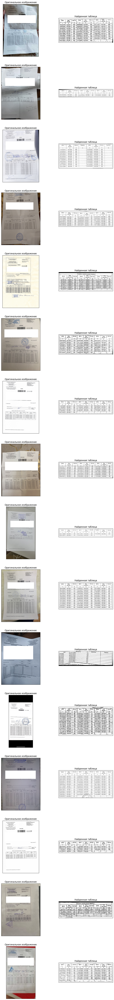

In [75]:
fig = plt.figure(figsize=(12, 100))
for i in range(len(paths_images)):
    image_path = original_dir + f'{i}' + '.jpg'
    
    original_img_bgr = cv2.imdecode(np.fromfile(image_path, dtype=np.uint8), cv2.IMREAD_COLOR)
    original_img_rgb = cv2.cvtColor(original_img_bgr, cv2.COLOR_BGR2RGB)
    fig.add_subplot(16, 2, (i+1)*2-1)
    plt.imshow(PILImage.fromarray(original_img_rgb))
    plt.xticks([])
    plt.yticks([])
    plt.title('Оригинальное изображение')
    
    table_extractor = te.TableExtractor(image_path, processor, model)
    perspective_corrected_image = table_extractor.execute()
    fig.add_subplot(16, 2, (i+1)*2)
    plt.imshow(PILImage.fromarray(perspective_corrected_image), cmap='gray')
    plt.xticks([])
    plt.yticks([])
    plt.title('Найденная таблица')
    
    cv2.imwrite(results_te + f'{i}' + '.jpg', perspective_corrected_image)   

Видно, что на некоторых изображениях качество после обрезки сильно падает.

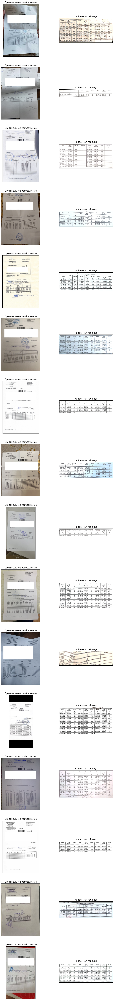

In [76]:
# Таблица извлекается из предобработанного, но не бинаризированного изображения
fig = plt.figure(figsize=(12, 100))
for i in range(len(paths_images)):
    image_path = original_dir + f'{i}' + '.jpg'
    
    original_img_bgr = cv2.imdecode(np.fromfile(image_path, dtype=np.uint8), cv2.IMREAD_COLOR)
    original_img_rgb = cv2.cvtColor(original_img_bgr, cv2.COLOR_BGR2RGB)
    fig.add_subplot(16, 2, (i+1)*2-1)
    plt.imshow(PILImage.fromarray(original_img_rgb))
    plt.xticks([])
    plt.yticks([])
    plt.title('Оригинальное изображение')
    
    table_extractor = te1.TableExtractor(image_path, processor, model)
    perspective_corrected_image = table_extractor.execute()
    fig.add_subplot(16, 2, (i+1)*2)
    plt.imshow(PILImage.fromarray(perspective_corrected_image), cmap='gray')
    plt.xticks([])
    plt.yticks([])
    plt.title('Найденная таблица')
    
    cv2.imwrite(results_te + f'{i}' + '.jpg', perspective_corrected_image)   

После работы TableExtractor1 качество упало не так сильно.

In [77]:
#  результат работы класса TableExtractor
# count = 0
# for image_path in paths_images:
#     table_extractor = te.TableExtractor(image_path, processor, model)
#     perspective_corrected_image = table_extractor.execute()
#     cv2.imwrite('results/'+f'{count}'+'.jpg', perspective_corrected_image)
#     plt.imshow(PILImage.fromarray(perspective_corrected_image), cmap='gray')
#     plt.show()
#     count += 1
#     if count == 6:
#         break

В результате работы данной части программы из исходных изображений были извлечены изображения таблиц, которые далее будут распознаваться с помощью `EasyOCR`.

## Распознавание информации в таблице с помощью библиотек img2table + EasyOCR

In [78]:
# сохраняю таблицы exel в папке results/te/ после работы класса TableExtractor
prep_im = [i for i in os.listdir(results_te) if 'jpg' in i]
for num in range(len(prep_im)):
        doc = Image(results_te + f"{num}" + '.jpg')
        ocr = EasyOCR(lang=["ru"])
        doc.to_xlsx(results_te + f"table_{num}" + '.xlsx',
                ocr=ocr,
                implicit_rows=False,
                borderless_tables=False)

In [79]:
# результат распознавания таблиц с помощью класса TableExtractor
for i in [1,5,7]:
    print(f'Пример {i}', pd.read_excel(results_te + f"table_{i}" + '.xlsx'), sep='\n')

Пример 1
         Дата Вид\nдон-ва  Кол-во      Дата.1 Вид\nдон-ва.1  Кол-во.1  \
0         NaN           2       3           4             5         6   
1  01.04.2015   кр/д (бв)     450  11.10.2017     крод (бв)       450   
2  27.07.2017         NaN     450  30.07.2018     кр/д (бв)       450   

       Дата.2 Вид\nдон-ва.2  Кол-во.2  
0         NaN             8         9  
1  16.10.2018     кр/д (бв)       450  
2  15.10.2019     кр/д (бв)       450  
Пример 5
  Unnamed: 0  а4;  Unnamed: 2 Unnamed: 3 Unnamed: 4
0        NaN  NaN         NaN        NaN         '-
1        NaN  NaN         NaN    м1 155]        157
2      з1алт  NaN       157.0        NaN        NaN
Пример 7
         Дата Вид\nдон-ва  Кол-во  Unnamed: 3      Дата.1 Вид\nдон-ва.1  \
0         NaN           2       3         NaN           4             5   
1  20.04.2011   кр/д (бв)     350         NaN  20.04.2017     кр/д (бв)   
2  13.03.2015   кр/д (бв)     450         NaN  02.08.2017     кр/д (бв)   
3         Na

In [80]:
# сохраняю таблицы exel в папке results/te1/ после работы класса TableExtractor1
prep_im = [i for i in os.listdir(results_te1) if 'jpg' in i]
for num1 in range(len(prep_im)):
        doc = Image(results_te1 + f"{num1}" + '.jpg')
        ocr = EasyOCR(lang=["ru"])
        doc.to_xlsx(results_te1 + f"table_{num1}" + '.xlsx',
                ocr=ocr,
                implicit_rows=False,
                borderless_tables=False)

In [81]:
# результат распознавания таблиц с помощью класса TableExtractor1
for i in [1,5,7]:
    print(f'Пример {i}', pd.read_excel(results_te1 + f"table_{i}" + '.xlsx'), sep='\n')

Пример 1
         Дата Вид\nдон-ва  Кол-во      Дата.1 Вид\nдон-ва.1  Кол-во.1  \
0         NaN           2       3           4             5         6   
1  01.04.2015   кр/д (бв)     450  11.10.2017     крод (бв)       450   
2  27.07.2017         NaN     450  30.07.2018     кр/д (бв)       450   

       Дата.2 Вид\nдон-ва.2  Кол-во.2  
0         NaN             8         9  
1  16.10.2018     кр/д (бв)       450  
2  15.10.2019     кр/д (бв)       450  
Пример 5
  Unnamed: 0  а4;  Unnamed: 2 Unnamed: 3 Unnamed: 4
0        NaN  NaN         NaN        NaN         '-
1        NaN  NaN         NaN    м1 155]        157
2      з1алт  NaN       157.0        NaN        NaN
Пример 7
         Дата Вид\nдон-ва  Кол-во  Unnamed: 3      Дата.1 Вид\nдон-ва.1  \
0         NaN           2       3         NaN           4             5   
1  20.04.2011   кр/д (бв)     350         NaN  20.04.2017     кр/д (бв)   
2  13.03.2015   кр/д (бв)     450         NaN  02.08.2017     кр/д (бв)   
3         Na

Выше показаны примеры работы img2table + EasyOCR.

## Пример работы TableToCsv

In [82]:
# пример работы TableToCsv на классе TableExtractor
table_list = [i for i in os.listdir(results_te) if 'xlsx' in i]

for num in range(len(table_list)):
    path = results_te + f"table_{num}"  + '.xlsx'
    save_path = results_te + f"csv_table_{num}"  + '.csv'
    try:
        table_to_csv = ta.TableToCsv(path, save_path)
        table = table_to_csv.result()
    except:
        pass

In [83]:
#пример работы класса TableToCsv1 на результатах работы класса на классе TableExtractor
for i in [1,5,8]:
    try:
        print(pd.read_csv(results_te + f"csv_table_{i}"  + '.csv'), sep='/n')
        print('\n')
    except:
        print('Таблица не распознана')
        print('\n')

  Дата донации  Кол-во    Класс крови   Тип донации
0   01.04.2015     450  Цельная кровь  Безвозмездно
1   27.07.2017     450  Цельная кровь  Безвозмездно
2   11.10.2017     450  Цельная кровь  Безвозмездно
3   30.07.2018     450  Цельная кровь  Безвозмездно
4   16.10.2018     450  Цельная кровь  Безвозмездно
5   15.10.2019     450  Цельная кровь  Безвозмездно


Таблица не распознана


  Дата донации  Кол-во    Класс крови   Тип донации
0   25.11.2020     450  Цельная кровь  Безвозмездно
1   26.02.2021     450  Цельная кровь  Безвозмездно
2   09.11.2021     450  Цельная кровь  Безвозмездно
3   16.09.2022     450  Цельная кровь  Безвозмездно
4   17.02.2023     450  Цельная кровь  Безвозмездно




In [84]:
# сохраняю результат работы TableToCsv1 
table_list = [i for i in os.listdir(results_te1) if 'xlsx' in i]

for num in range(len(table_list)):
    path = results_te1 + f"table_{num}"  + '.xlsx'
    save_path = results_te1 + f"csv_table_{num}"  + '.csv'
    try:
        table_to_csv = ta.TableToCsv(path, save_path)
        table = table_to_csv.result()
    except:
        pass

In [85]:
#пример работы класса TableToCsv1 на результатах работы класса на классе TableExtractor1
for i in [1,5,8]:
    try:
        print(pd.read_csv(results_te1 + f"csv_table_{i}"  + '.csv'), sep='/n')
        print('\n')
    except:
        print('Таблица не распознана')
        print('\n')

  Дата донации  Кол-во    Класс крови   Тип донации
0   01.04.2015     450  Цельная кровь  Безвозмездно
1   27.07.2017     450  Цельная кровь  Безвозмездно
2   11.10.2017     450  Цельная кровь  Безвозмездно
3   30.07.2018     450  Цельная кровь  Безвозмездно
4   16.10.2018     450  Цельная кровь  Безвозмездно
5   15.10.2019     450  Цельная кровь  Безвозмездно


Таблица не распознана


  Дата донации  Кол-во    Класс крови   Тип донации
0   25.11.2020     450  Цельная кровь  Безвозмездно
1   26.02.2021     450  Цельная кровь  Безвозмездно
2   09.11.2021     450  Цельная кровь  Безвозмездно
3   16.09.2022     450  Цельная кровь  Безвозмездно
4   17.02.2023     450  Цельная кровь  Безвозмездно




## Подсчет метрики accuracy

In [86]:
# функция расчета метрики для изображения
def advanced_compare(df1, df2):
    length = min(df1.shape[0], df2.shape[0])
    df1 = df1.iloc[:length]
    df2 = df2.iloc[:length]
    counter = 0
    for i in range(df1.shape[0]):
        for j in range(df1.shape[1]):
            if df1.iloc[i, j] == df2.iloc[i, j]:
                counter += 1
    return round(counter / (df1.shape[0] * df1.shape[1]) * 100, 2)

In [87]:
# сохраняю метрику в список list_te для обработанных изображений (класс)
list_te = []

for i in range(len(paths_images)):
    try:
        df1 = pd.read_csv(original_dir + f'{i}.csv')[['Дата донации', 'Тип донации', 'Класс крови']]
        df2 = pd.read_csv(results_te+ f'csv_table_{i}.csv')[['Дата донации', 'Тип донации', 'Класс крови']]
        list_te.append(advanced_compare(df1, df2))
    except:
        list_te.append(0)

In [88]:
# метрика accuracy для каждого изображения (TableExtractor)
pd.Series(list_te)

0      39.39
1     100.00
2      98.48
3      64.81
4      56.67
5       0.00
6     100.00
7       0.00
8     100.00
9     100.00
10      0.00
11      0.00
12     99.10
13     81.82
14      0.00
15      0.00
dtype: float64

In [89]:
# среднее значение метрики (TableExtractor)
statistics.mean(list_te)

52.516875

In [90]:
list_te1 = []

for i in range(len(paths_images)):
    try:
        df1 = pd.read_csv(original_dir + f'{i}.csv')[['Дата донации', 'Тип донации', 'Класс крови']]
        df2 = pd.read_csv(results_te1+ f'csv_table_{i}.csv')[['Дата донации', 'Тип донации', 'Класс крови']]
        list_te1.append(advanced_compare(df1, df2))
    except:
        list_te1.append(0)

In [91]:
# среднее значение метрики (TableExtractor1)
statistics.mean(list_te1)

52.516875

In [92]:
# метрика accuracy для каждого изображения (TableExtractor1)
pd.Series(list_te1)

0      39.39
1     100.00
2      98.48
3      64.81
4      56.67
5       0.00
6     100.00
7       0.00
8     100.00
9     100.00
10      0.00
11      0.00
12     99.10
13     81.82
14      0.00
15      0.00
dtype: float64

Для двух классов предобработки значения метрик получиличь одинаковые.

## Выводы

В ходе работы были исследована библиотека img2table с двумя различными вариантами OCR: Tesseract и EasyOCR. Лучше всего с поставленной задачей справляется EasyOCR, однако без предварительной обработки распознавание таблиц работает плохо, поэтому нужно будет предобрабатывать изображения. Для предобработки и выделения таблицы из фото было реализовано два класса: TableExtractor и TableExtractor1 (TableExtractor выдает бинаризированное изображение, для TableExtractor1 таблица извлекается из предобработанного, но не бинаризированного изображения). Далее таблицы обрабатывались с помощью img2table и EasyOCR, далее формировались exel таблицы. Так как exel таблицы и таблицы на фото имели разные форматы, то с помощью класса TableToCsv exel приводились к единому образца.

Завершаюшим этапов работы была проверка значения метрики accuracy на полученных от заказчика csv файлах. Оба класса предобработки TableExtractor и TableExtractor1 показали результат около 53%. 

В результате данной работы можно сделать вывод о том, что на факт распознавания изображения в первую очередь влияет качество самого изображения. Лучше всего распознаются светлые изображения с равномерным освещением и четким текстом в таблице.